In [1]:
import ssim_test as ssim_lib

In [2]:
import SimpleITK as sitk
import numpy as np
import torch
from torchvision.utils import save_image, make_grid
from scipy.ndimage.filters import gaussian_filter as blur
import matplotlib.pyplot as plt

## Load CT Samples and preprocess 

In [3]:
MIN_B = -150
MAX_B = 150

img_a = sitk.ReadImage('/workspace/data/CT_LUNG1/train/LUNG1-001_20190225_CT/CT.nrrd')                
img_b = sitk.ReadImage('/workspace/data/CT_LUNG1/train/LUNG1-001_20190225_CT/CT.nrrd')                

In [4]:
array_a = np.clip(sitk.GetArrayFromImage(img_a), MIN_B, MAX_B)
array_b = np.clip(sitk.GetArrayFromImage(img_b), MIN_B, MAX_B)

array_a = (array_a - MIN_B) / (MAX_B - MIN_B)
array_b = (array_b - MIN_B) / (MAX_B - MIN_B)

In [5]:
channels_ssim = array_a.shape[0]

# array_b = blur(array_b, sigma=3)

X = torch.Tensor(array_a).unsqueeze(dim=0)
Y = torch.Tensor(array_b).unsqueeze(dim=0)

In [6]:
X_grad = ssim_lib.gradient_image(X)
Y_grad = ssim_lib.gradient_image(Y)

## Extract 3-components of Image

In [10]:
gmax = X_grad.max()
th1 = 0.12 * gmax
th2 = 0.06 * gmax


win = ssim_lib._fspecial_gauss_1d(11, 1.5).repeat(channels_ssim, 1, 1, 1)

SSIM_map = ssim_lib.batch_ssim(X, Y,
            data_range=255,
            win=win,
            K=(0.01, 0.03),
            nonnegative_ssim=False,
            reduction=None)


print(SSIM_map.shape)

edge_mask = (X_grad[..., :SSIM_map.shape[-2], :SSIM_map.shape[-1]] > th1 ) | (Y_grad[..., :SSIM_map.shape[-2], :SSIM_map.shape[-1]] > th1)
smooth_mask = (X_grad[..., :SSIM_map.shape[-2], :SSIM_map.shape[-1]] < th2) & (Y_grad[..., :SSIM_map.shape[-2], :SSIM_map.shape[-1]] <= th1)
texture_mask = ~(edge_mask | smooth_mask)

torch.Size([1, 134])
torch.Size([1, 134, 502, 502])


In [11]:
edge_map = edge_mask * SSIM_map
smooth_map = smooth_mask * SSIM_map
texture_map = texture_mask * SSIM_map

In [12]:
combined = 0.5 * edge_map[edge_mask !=0].mean() + 0.25 * smooth_map[smooth_mask !=0].mean() + 0.25 * texture_map[texture_mask !=0].mean()

In [13]:
combined

tensor(1.)

In [38]:
plt_a_edge = edge_mask.permute(1, 0, 2, 3).double()
plt_a_texture = texture_mask.permute(1, 0, 2, 3).double()
plt_a_smooth = smooth_mask.permute(1, 0, 2, 3).double()

plt_combined = combined.permute(1, 0, 2, 3).double()

In [39]:
plt_a_edge = make_grid(plt_a_edge)
plt_a_texture = make_grid(plt_a_texture)
plt_a_smooth = make_grid(plt_a_smooth)

plt_combined = make_grid(plt_combined)

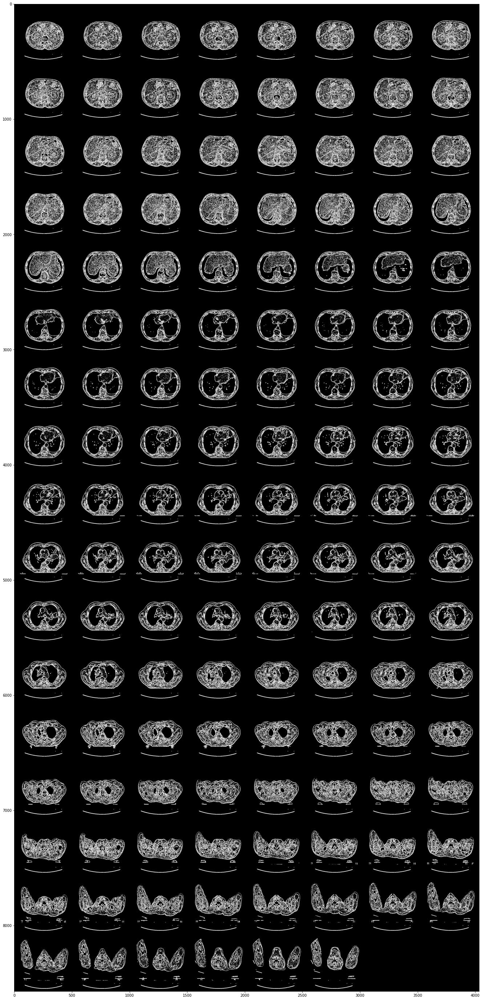

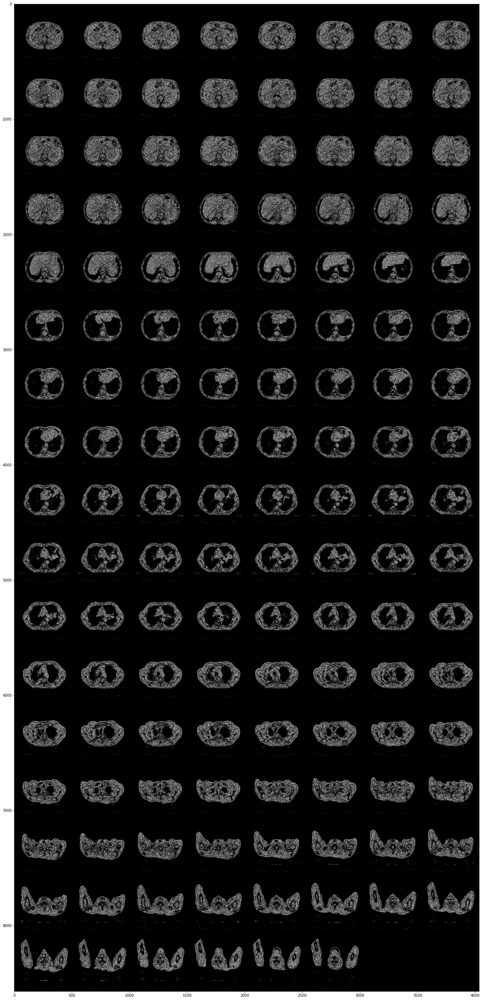

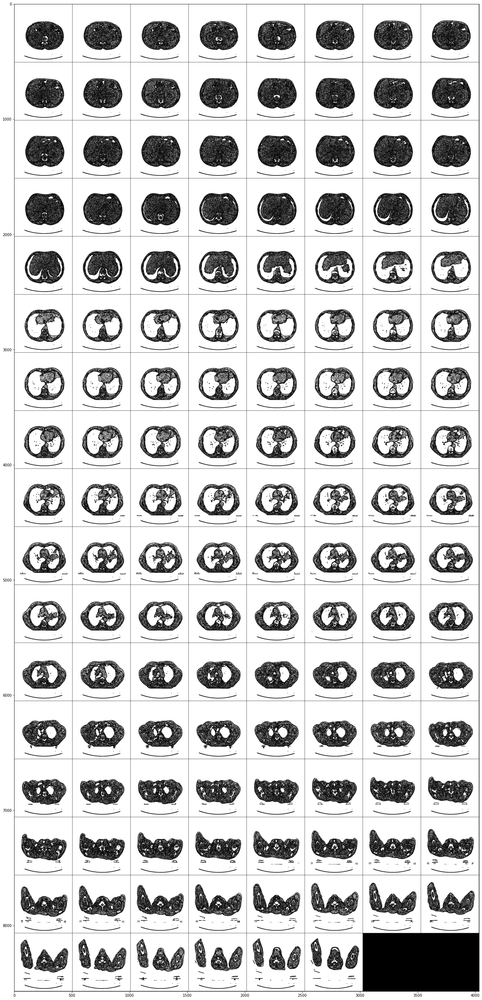

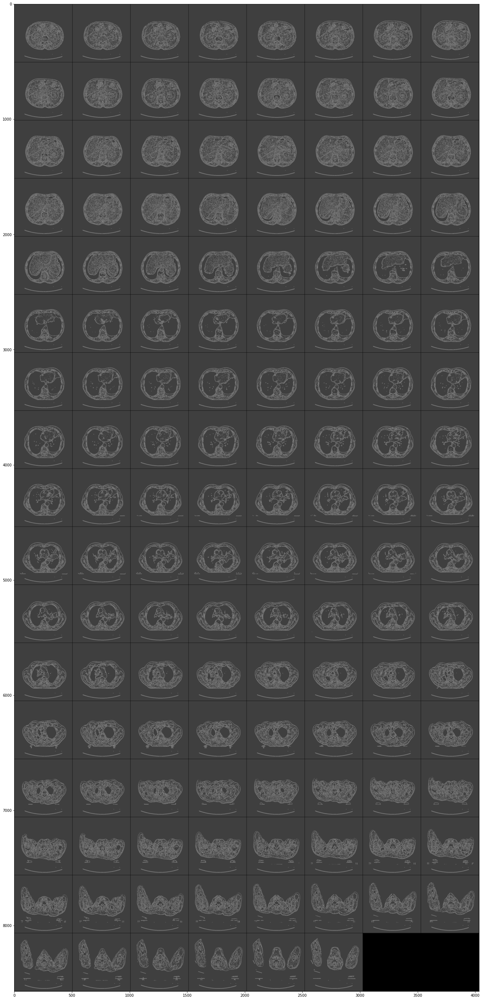

In [40]:
f = plt.figure(figsize=(30, 50))
plt.imshow(plt_a_edge.permute(1, 2, 0))

f = plt.figure(figsize=(30, 50))
plt.imshow(plt_a_texture.permute(1, 2, 0))

f = plt.figure(figsize=(30, 50))
plt.imshow(plt_a_smooth.permute(1, 2, 0))

f = plt.figure(figsize=(30, 50))
plt.imshow(plt_combined.permute(1, 2, 0))